In [4]:
import numpy as np
from eryn.backends import HDFBackend as eryn_HDF_Backend
import matplotlib.pyplot as plt
import corner
import os
import warnings
import matplotlib.lines as mlines
from matplotlib.font_manager import FontProperties
plt.rcParams['font.size'] = 20

notebook_direc = os.getcwd()
plot_direc = notebook_direc + "/corner_plots"
run_direc = "/data/asantini/emris/eccentric_kerr/KerrEccentricEquatorialFigures/scripts/Results/PE_studies/mcmc_code/PE_samples"

os.listdir(run_direc)

['Case_2_extreme_EMRI_prograde',
 'Case_1_EMRI_prograde',
 'Case_4_light_IMRI_prograde',
 'Case_3_heavy_IMRI_prograde',
 'Case_5_EMRI_retrograde']

In [11]:
# Now analyse the results using 9PN for circular orbits
    
def analyse_samples(file_path, discard = 0, plot_log_like = True):
    reader = eryn_HDF_Backend(file_path,read_only = True)

    N_iterations = reader.get_chain()['model_0'].shape[0]
    N_temps = reader.get_chain()['model_0'].shape[1]
    N_walkers = reader.get_chain()['model_0'].shape[2]
    N_params = reader.get_chain()['model_0'].shape[-1]

    samples_after_burnin = [reader.get_chain(discard = discard)['model_0'][:,i].reshape(-1,N_params) 
                        for i in range(N_temps)]  # Take true chain]

    log_like = reader.get_log_like(discard = discard)

    if plot_log_like:
        plt.plot(log_like[:,0,:]);
        plt.xlabel(r'Iteration')
        plt.ylabel(r'Log likelihood')
        plt.show()
    return samples_after_burnin, reader, log_like, N_params,

def corner_plot(burned_samples, true_params, param_labels, corner_kwargs, title = r'Corner plot', plot_name = None):
    N_params = len(param_labels)
    true_params = true_params[0:N_params]
    trunc_samples = burned_samples[0][:,:N_params]
    print(trunc_samples.shape)
    
    samples_corner = np.column_stack(trunc_samples)

    figure = corner.corner(trunc_samples,bins = 30, color = 'blue', **corner_kwargs)

    
    axes = np.array(figure.axes).reshape((N_params, N_params))

    for i in range(N_params):
        ax = axes[i, i]
        ax.axvline(true_params[i], color="k")

    for yi in range(N_params):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axhline(true_params[yi], color="k")
            ax.axvline(true_params[xi],color= "k")
            ax.plot(true_params[xi], true_params[yi], "sk")

    for ax in figure.get_axes():
        ax.tick_params(axis='both', labelsize=18)

    blue_line = mlines.Line2D([], [], color='blue', label=r'Posterior Distributions')
    black_line = mlines.Line2D([], [], color='black', label='True Value')

    # plt.legend(handles=[blue_line,black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = title, title_fontproperties = FontProperties(size = , weight = 'bold'))
    # plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)
    if plot_name:
        plt.savefig(plot_name, bbox_inches = "tight")
    return figure

def remove_bad_walkers(reader_from_sampler, log_like_threshold = -170, burn = 400, plot_log_like = True):

    
    N_temps = reader_from_sampler.get_chain()['model_0'].shape[1]
    N_params = reader_from_sampler.get_chain()['model_0'].shape[-1]
    samples = reader_from_sampler.get_chain(discard = burn)['model_0']
    log_like = reader_from_sampler.get_log_like(discard = burn)
    
    # Define the log-likelihood threshold
    log_like_threshold = -170
    
    # Identify walkers that ever go below the threshold
    # bad_walkers = np.any(log_like < log_like_threshold, axis=0)  # Shape: (1, 50)
    
    # Convert to boolean mask (negate to keep good walkers)
    good_walkers_mask = ~bad_walkers.squeeze()  # Shape: (50,)
    
    # Apply the mask to remove bad walkers
    filtered_log_like = log_like[:, :, good_walkers_mask]  # New shape: (1208, 1, <fewer walkers>)
    filtered_samples = samples[:, :, good_walkers_mask, :, :]  # New shape: (1208, 1, <fewer walkers>, 1, 12)

    recast_samples = [filtered_samples[:,i].reshape(-1,N_params) for i in range(N_temps)]  # Take true chain]  

    if plot_log_like:
        plt.plot(filtered_log_like[:,0,:]);
        plt.xlabel(r'Iteration')
        plt.ylabel(r'Log likelihood -- cleaned')
        plt.show()
    
    return filtered_log_like, recast_samples

import h5py

def save_samples_h5(samples, no_samples = 30000, 
                    true_vals = None, 
                    file_name = "samples.h5", param_labels = "param_labels",
                    file_path = None):
    samples_array = samples[0]
    
    # Truncate to last 30,000 samples
    truncated_samples = samples_array[-1*no_samples:, :]
    
    # Parameter labels and true values
    params_label_full = [r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                         r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                         r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                         r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"]
    
    true_vals_EMRI_case_1 = [1e6, 10.0, 0.998, 7.7275, 0.73, 2.204, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]
    
    # Create dictionary for samples
    samples_dict = {
        label: truncated_samples[:, i] for i, label in enumerate(params_label_full)
    }
    
    # Save to .h5 file
    with h5py.File(file_path + file_name, "w") as f:
        # Save each parameter's samples
        for key, values in samples_dict.items():
            f.create_dataset(f"samples/{key}", data=values)
        
        # Save true values
        f.create_dataset("true_values", data=true_vals)
        
        # Save parameter labels (as fixed-length ASCII strings)
        dt = h5py.string_dtype(encoding='utf-8')
        f.create_dataset(param_labels, data=np.array(params_label_full, dtype=dt))


def load_samples_h5(file_path):
    with h5py.File(file_path, "r") as f:
        # Load parameter labels
        param_labels = [label.decode('utf-8') if isinstance(label, bytes) else label
                        for label in f["param_labels"][()]]

        # Load true values
        true_vals = f["true_values"][()]

        paper_labels = [r"$m_1/M_{\odot}$", r"$m_2/M_{\odot}$", r"$a$",
                        r"$p_{0}$", r"$e_{0}$", r"$d_{\rm L}/\rm{Gpc}$",
                        r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$",
                        r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"]

        # Load samples into a dictionary
        samples_dict = {}
        for paper_label, label in zip(paper_labels, param_labels):
            samples_dict[paper_label] = f[f"samples/{label}"][()]

    return samples_dict, paper_labels, true_vals

# Ollie's code

In [ ]:
file_path_1eneg5 = run_direc +  '/Case_1_EMRI_prograde/' + 'MCMC_samps_M_1e6_mu_10_a_0p998_e0_0p73_p0_7p7275_e0_0p73_pro_SNR_50_dt_5_T_2_eps_0p0_recov_eps_1e-5_dt_5_T_2_TDI2_w_background_equal_arms.h5'
file_path_1eneg2 = run_direc + '/Case_1_EMRI_prograde/' + 'MCMC_samps_M_1e6_mu_10_a_0p998_e0_0p73_p0_7p7275_e0_0p73_pro_SNR_50_dt_5_T_2_eps_0p0_recov_eps_1e-2_dt_5_T_2_TDI2_w_background_equal_arms.h5'

burned_samples_EMRI_1eneg5, _, log_like_IMRI, N_params = analyse_samples(file_path_1eneg5, discard = 400)
plt.clf()
burned_samples_EMRI_1eneg2, _, log_like_IMRI, N_params = analyse_samples(file_path_1eneg2, discard = 1000)

# Try and process some of the samples so they can be pushed to .git 

import numpy as np
true_vals_EMRI_case_1 = [1e6, 10.0, 0.998, 7.7275, 0.73, 2.204, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]

save_samples_h5(burned_samples_EMRI_1eneg5, no_samples = 30000, 
                    true_vals = true_vals_EMRI_case_1, 
                    file_name = "/prograde_EMRI_case_1_1eneg5.h5", param_labels = "param_labels",
                    file_path = run_direc + "/Case_1_EMRI_prograde")

save_samples_h5(burned_samples_EMRI_1eneg2, no_samples = 30000, 
                    true_vals = true_vals_EMRI_case_1, 
                    file_name = "/prograde_EMRI_case_1_1eneg2.h5", param_labels = "param_labels",
                    file_path = run_direc + "/Case_1_EMRI_prograde")

AttributeError: You must run the sampler with 'store == True' before accessing the results.When using the HDF backend, make sure you have the filepath correctly set. This is the error thatis given if the backend cannot find the file.

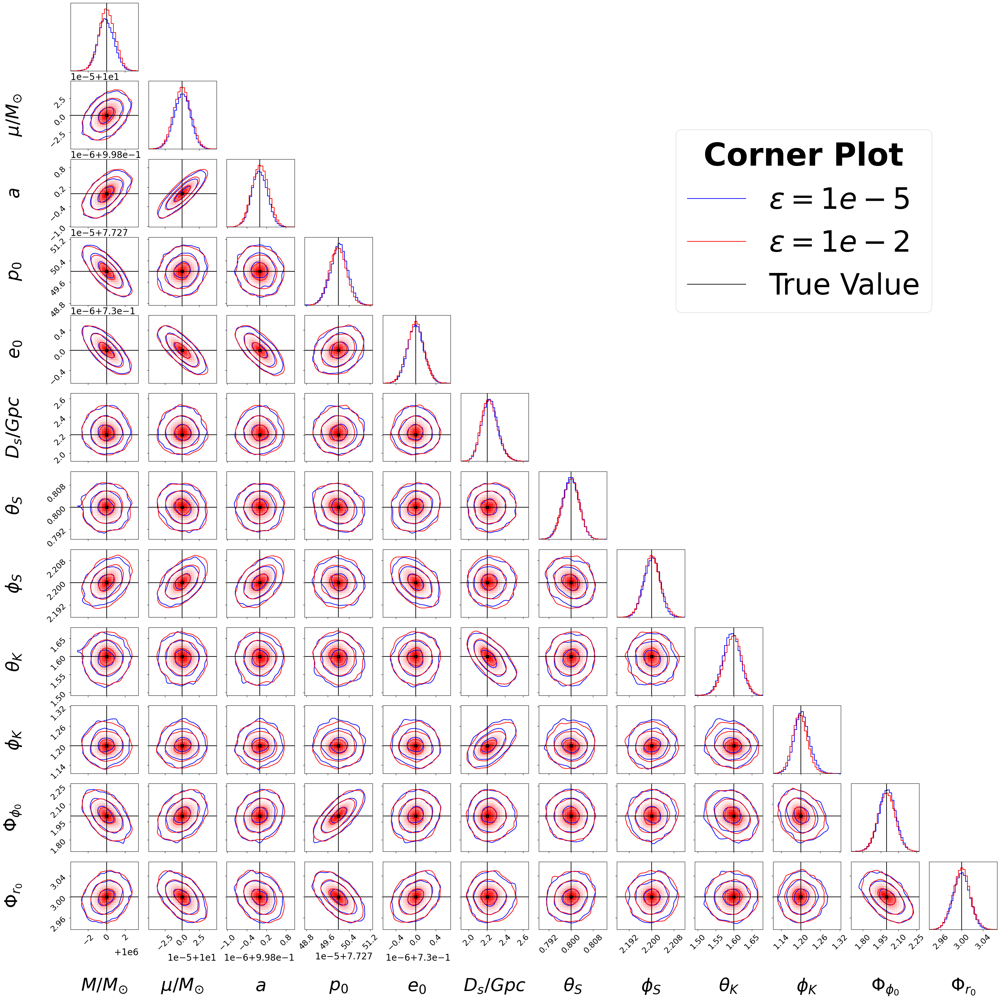

In [30]:
# Check with eps = 1e-5 and eps = 1e-2 

true_vals_EMRI_case_1 = [1e6, 10.0, 0.998, 7.7275, 0.73, 2.204, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(burned_samples_EMRI_1eneg5)
samples_corner_1eneg2 = np.column_stack(burned_samples_EMRI_1eneg2)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg2[:,0]))*np.ones(len(samples_corner_1eneg2[:,0]))
corner.corner(samples_corner_1eneg2, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_EMRI_case_1[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_EMRI_case_1[yi], color="k")
        ax.axvline(true_vals_EMRI_case_1[xi],color= "k")
        ax.plot(true_vals_EMRI_case_1[xi], true_vals_EMRI_case_1[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)
blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-2$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



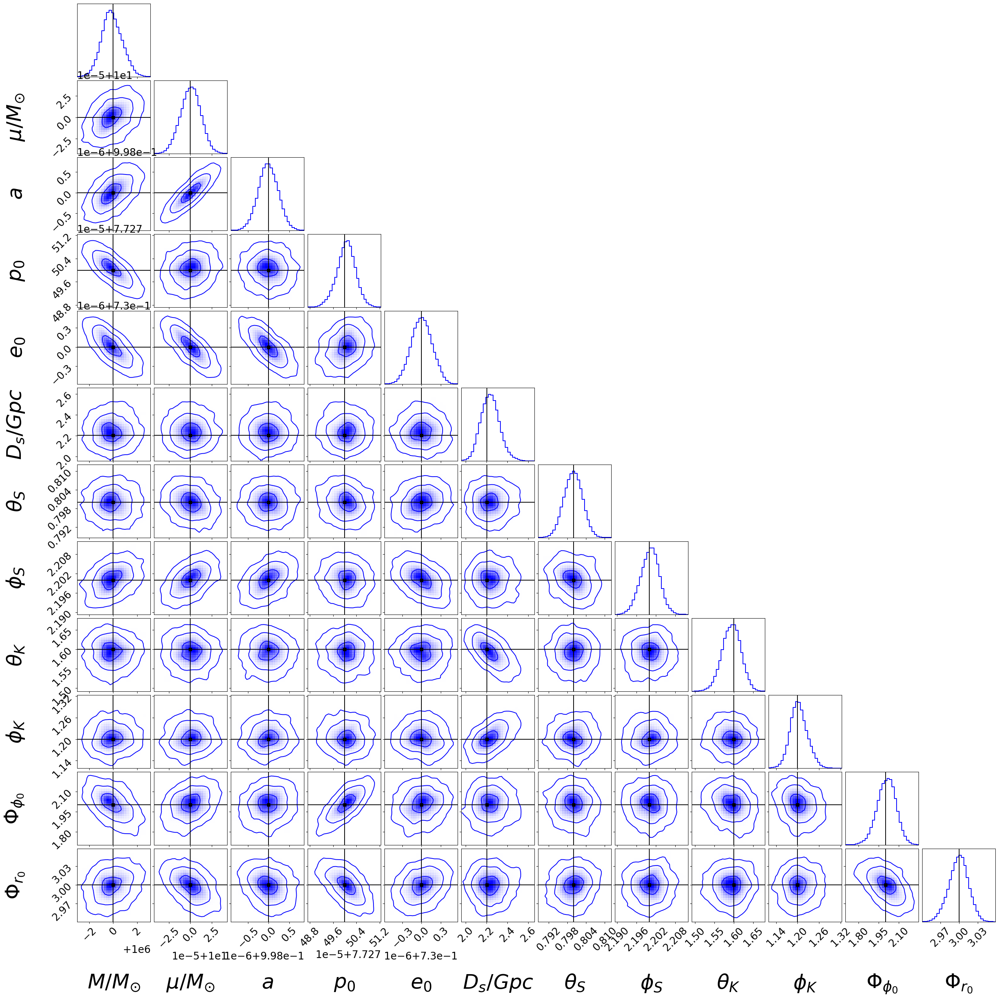

In [44]:

file_path = run_direc + "/Case_1_EMRI_prograde" + "/prograde_EMRI_case_1_1eneg5.h5"
samples_dict, param_labels, true_vals =  load_samples_h5(file_path)

check = list(samples_dict.values())


fun =  corner.corner(np.column_stack(check),bins = 30, color = 'blue', **corner_kwargs)

axes = np.array(fun.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_EMRI_case_1[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_EMRI_case_1[yi], color="k")
        ax.axvline(true_vals_EMRI_case_1[xi],color= "k")
        ax.plot(true_vals_EMRI_case_1[xi], true_vals_EMRI_case_1[yi], "sk")

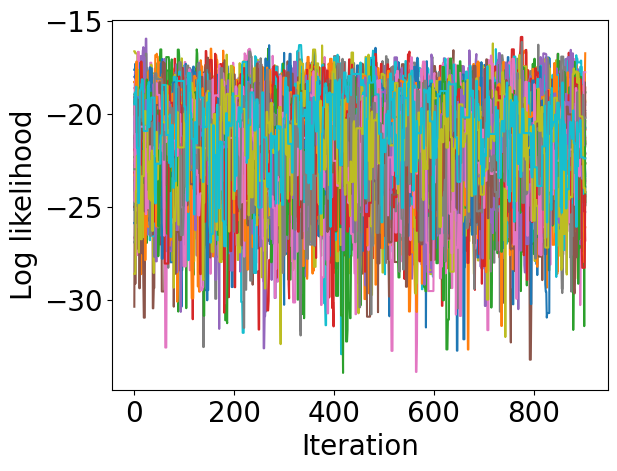

904


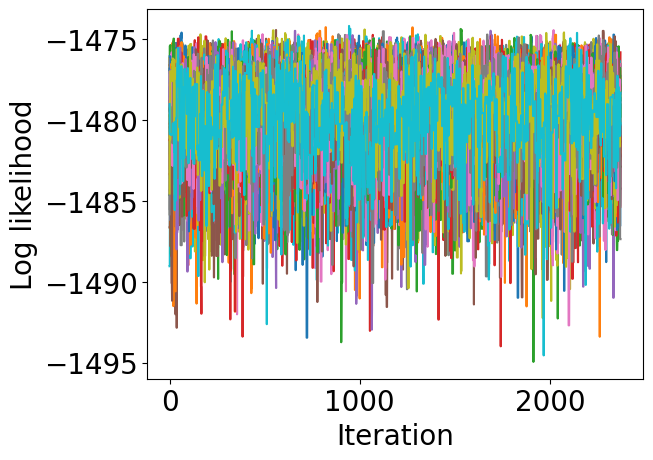

2373


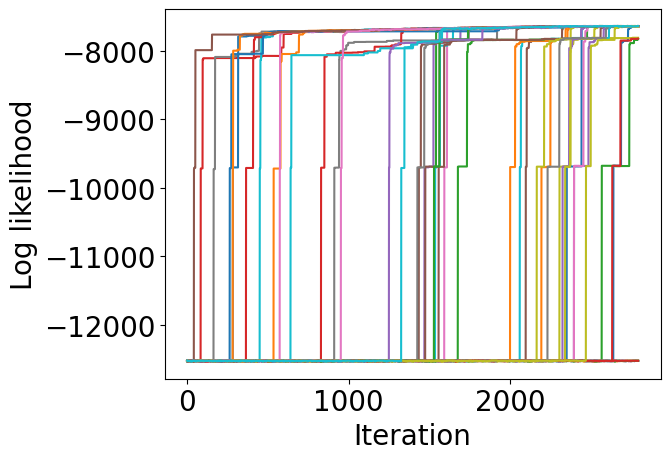

2796


In [23]:
file_path_heavy_IMRI_1eneg5 = run_direc + "/Case_3_heavy_IMRI_prograde/" + 'MCMC_samps_M_1e7_mu_1e5_a_0p95_e0_0p85_p0_23p425_pro_SNR_500_eps_0p0_recov_eps_1e-5_dt_5_T_2_TDI2_w_background_equal_arms.h5'
file_path_heavy_IMRI_1eneg3 = run_direc + "/Case_3_heavy_IMRI_prograde/" + 'MCMC_samps_M_1e7_mu_1e5_a_0p95_e0_0p85_p0_23p425_pro_SNR_500_eps_0p0_recov_eps_1e-3_dt_5_T_2_TDI2_w_background_equal_arms.h5'
file_path_heavy_IMRI_1eneg2 = run_direc + "/Case_3_heavy_IMRI_prograde/" + 'MCMC_samps_M_1e7_mu_1e5_a_0p95_e0_0p85_p0_23p425_pro_SNR_500_eps_0p0_recov_eps_1e-2_dt_5_T_2_TDI2_w_background_equal_arms.h5'

burned_samples_heavy_IMRI_1eneg5, _, log_like_IMRI, N_params = analyse_samples(file_path_heavy_IMRI_1eneg5, discard = 1000)
print(len(log_like_IMRI[:,0,:]))
plt.clf()
burned_samples_heavy_IMRI_1eneg3, _, log_like_IMRI, N_params = analyse_samples(file_path_heavy_IMRI_1eneg3, discard = 1000)
print(len(log_like_IMRI[:,0,:]))
plt.clf()
burned_samples_heavy_IMRI_1eneg2, _, log_like_IMRI, N_params = analyse_samples(file_path_heavy_IMRI_1eneg2, discard = 1000)
print(len(log_like_IMRI[:,0,:]))

median_dist_heavy_IMRI = np.median(burned_samples_heavy_IMRI_1eneg5[0][:,5])

true_vals_IMRI_case_3 = [1e7, 1e5, 0.95, 23.425, 0.85, median_dist_heavy_IMRI, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]

save_samples_h5(burned_samples_heavy_IMRI_1eneg5, no_samples = 30000, 
                    true_vals = true_vals_IMRI_case_3, 
                    file_name = "/Heavy_IMRI_case_5_1eneg5.h5", param_labels = "param_labels",
                    file_path = run_direc + "/Case_3_heavy_IMRI_prograde")

save_samples_h5(burned_samples_heavy_IMRI_1eneg3, no_samples = 30000, 
                    true_vals = true_vals_IMRI_case_3, 
                    file_name = "/Heavy_IMRI_case_5_1eneg3.h5", param_labels = "param_labels",
                    file_path = run_direc + "/Case_3_heavy_IMRI_prograde")

save_samples_h5(burned_samples_heavy_IMRI_1eneg5, no_samples = 30000, 
                    true_vals = true_vals_IMRI_case_3, 
                    file_name = "/Heavy_IMRI_case_5_1eneg2.h5", param_labels = "param_labels",
                    file_path = run_direc + "/Case_3_heavy_IMRI_prograde")



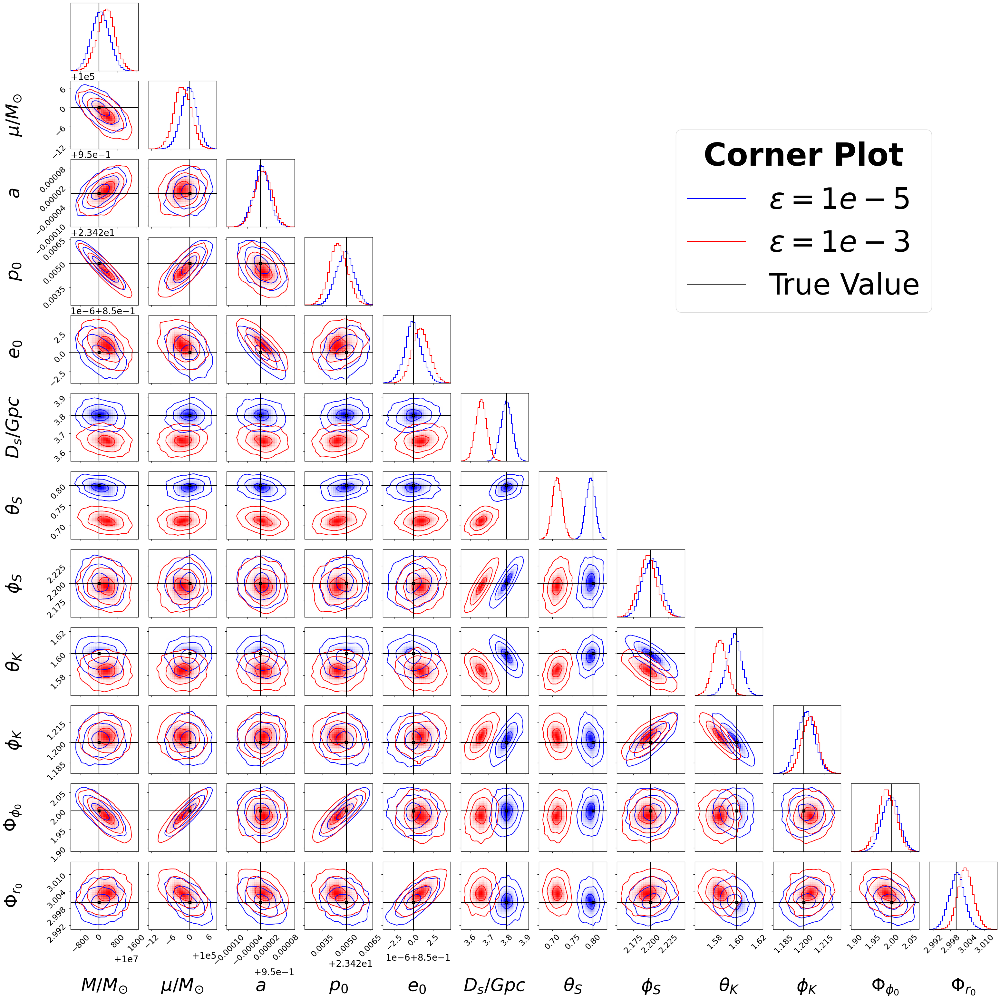

In [10]:
true_vals_IMRI_case_3 = [1e7, 1e5, 0.95, 23.425, 0.85, median_dist_heavy_IMRI, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(burned_samples_heavy_IMRI_1eneg5)
samples_corner_1eneg3 = np.column_stack(burned_samples_heavy_IMRI_1eneg3)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg3[:,0]))*np.ones(len(samples_corner_1eneg3[:,0]))
corner.corner(samples_corner_1eneg3, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_IMRI_case_3[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_IMRI_case_3[yi], color="k")
        ax.axvline(true_vals_IMRI_case_3[xi],color= "k")
        ax.plot(true_vals_IMRI_case_3[xi], true_vals_IMRI_case_3[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)
blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-3$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



In [49]:
file_path_retro_EMRI_1eneg5 = run_direc + '/Case_5_EMRI_retrograde/' + 'MCMC_samps_M_1e5_mu_10_a_0p5_p0_26p19_e0_0p8_ret_SNR_30_eps_0p0_recov_eps_1e-5_dt_5_T_2_TDI2_w_background_equal_arms.h5'
file_path_retro_EMRI_1eneg2 = run_direc + '/Case_5_EMRI_retrograde/' + 'MCMC_samps_M_1e5_mu_10_a_0p5_p0_26p19_e0_0p8_ret_SNR_30_eps_0p0_recov_eps_1e-2_dt_5_T_2_TDI2_w_background_equal_arms.h5'
# file_path_retro_IMRI_1eneg2 = run_direc + 'MCMC_samps_M_1e7_mu_1e5_a_0p95_e0_0p85_p0_23p425_pro_SNR_500_eps_0p0_recov_eps_1e-2_dt_5_T_2_TDI2_w_background_equal_arms.h5'

burned_samples_retro_EMRI_1eneg5, reader_retro_EMRI_1eneg5, log_like_IMRI_1eneg_5, N_params = analyse_samples(file_path_retro_EMRI_1eneg5, discard = 400, plot_log_like = False)
burned_samples_retro_EMRI_1eneg2, reader_retro_EMRI_1eneg2, log_like_IMRI_1eneg_2, N_params = analyse_samples(file_path_retro_EMRI_1eneg2, discard = 400, plot_log_like = False)
plt.clf()

filtered_log_like_retro_EMRI_1eneg5, filtered_samples_retro_EMRI_1eneg5 = remove_bad_walkers(reader_retro_EMRI_1eneg5, plot_log_like = False)
filtered_log_like_retro_EMRI_1eneg2, filtered_samples_retro_EMRI_1eneg2 = remove_bad_walkers(reader_retro_EMRI_1eneg2, plot_log_like = False)
plt.clf()
median_dist_retro_EMRI = np.median(filtered_samples_retro_EMRI_1eneg5[0][:,5])
true_vals_EMRI_case_5 = [1e5, 10.0, 0.5, 26.19, 0.8, median_dist_retro_EMRI, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]

save_samples_h5(filtered_samples_retro_EMRI_1eneg5, no_samples = 30000, 
                    true_vals = true_vals_EMRI_case_5, 
                    file_name = "/retrograde_EMRI_case_5_1eneg5.h5", param_labels = "param_labels",
                    file_path = run_direc + "/Case_5_EMRI_retrograde")

save_samples_h5(filtered_samples_retro_EMRI_1eneg2, no_samples = 30000, 
                    true_vals = true_vals_EMRI_case_5, 
                    file_name = "/retrograde_EMRI_case_5_1eneg2.h5", param_labels = "param_labels",
                    file_path = run_direc + "/Case_5_EMRI_retrograde")



<Figure size 640x480 with 0 Axes>

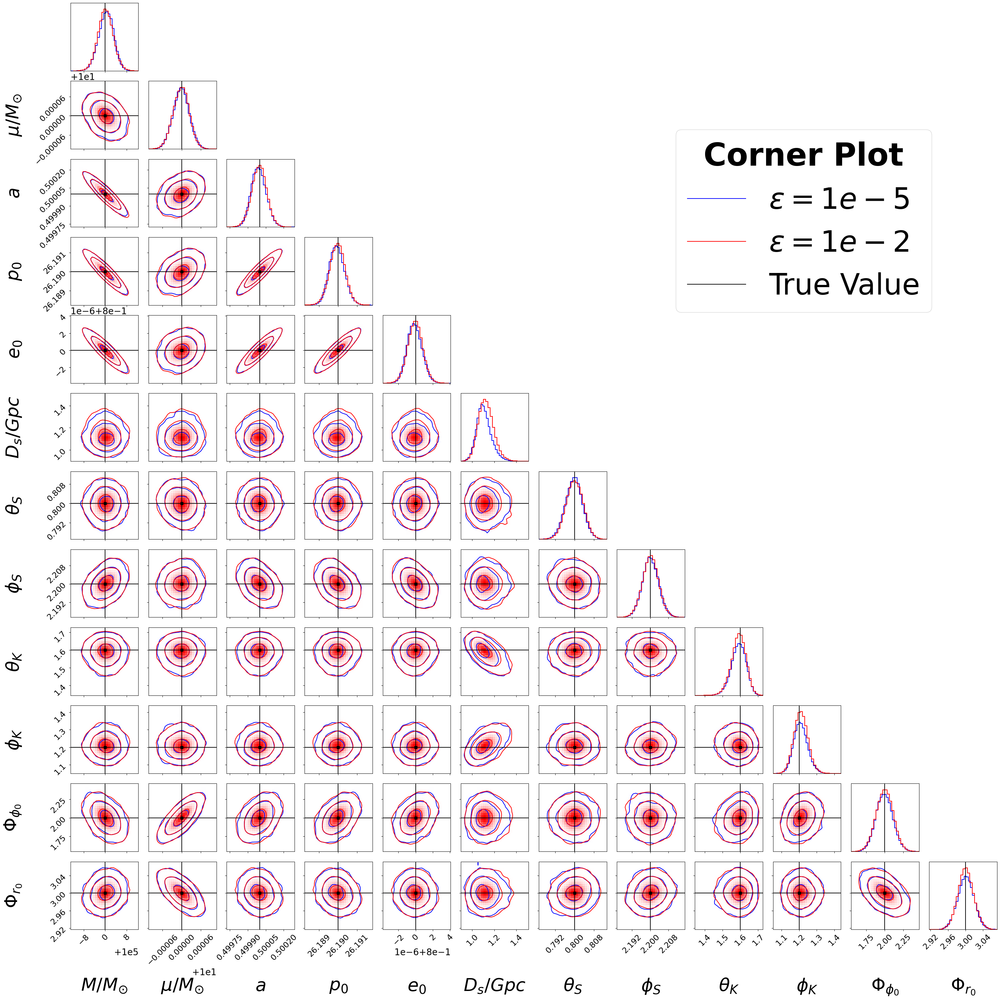

In [46]:
# CASE 5

true_vals_EMRI_case_5 = [1e5, 10.0, 0.5, 26.19, 0.8, 2.204, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(filtered_samples_retro_EMRI_1eneg5)
samples_corner_1eneg2 = np.column_stack(filtered_samples_retro_EMRI_1eneg2)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg2[:,0]))*np.ones(len(samples_corner_1eneg2[:,0]))
corner.corner(samples_corner_1eneg2, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_EMRI_case_5[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_EMRI_case_5[yi], color="k")
        ax.axvline(true_vals_EMRI_case_5[xi],color= "k")
        ax.plot(true_vals_EMRI_case_5[xi], true_vals_EMRI_case_5[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)
blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-2$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



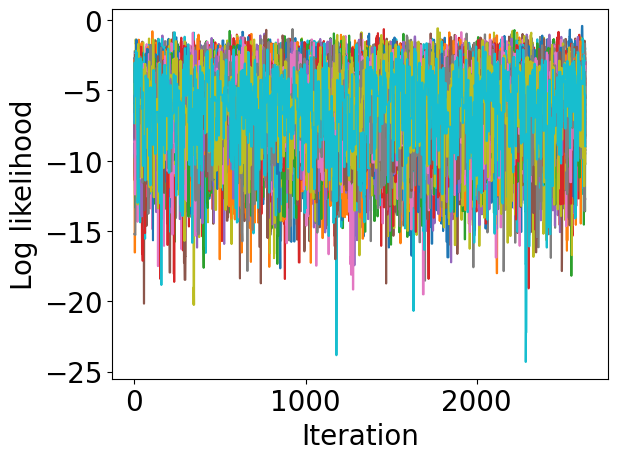

2635


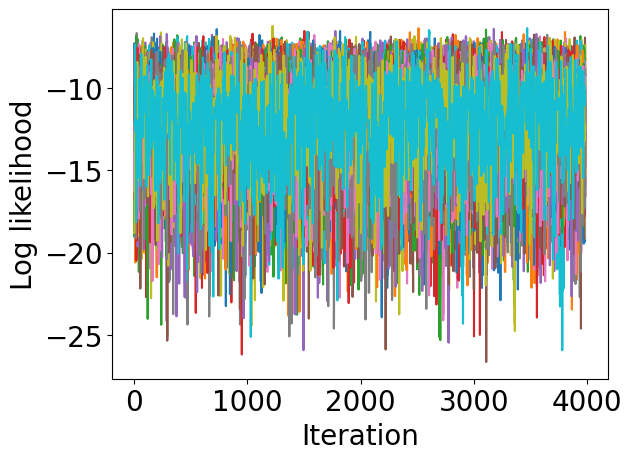

3986


In [47]:
# Extreme EMRI with crazy mass-ratio, Case 2
file_path_extreme_EMRI_1eneg5 = run_direc + "/Case_2_extreme_EMRI_prograde/"+ "MCMC_samps_M_1e7_mu_10_a_0p998_p0_2p12_e0_0p425_pro_SNR_30_eps_0p0_recov_eps_1e-5_dt_10_T_2_TDI2_w_background_equal_arms.h5"
file_path_extreme_EMRI_1eneg2 = run_direc + "/Case_2_extreme_EMRI_prograde/" + "MCMC_samps_M_1e7_mu_10_a_0p998_p0_2p12_e0_0p425_pro_SNR_30_eps_0p0_recov_eps_1e-2_dt_10_T_2_TDI2_w_background_equal_arms.h5"

burned_samples_extreme_EMRI_1eneg5, _, log_like_IMRI, N_params = analyse_samples(file_path_extreme_EMRI_1eneg5, discard = 1000)
print(len(log_like_IMRI[:,0,:]))
plt.clf()
burned_samples_extreme_EMRI_1eneg2, _, log_like_IMRI, N_params = analyse_samples(file_path_extreme_EMRI_1eneg2, discard = 2000)
print(len(log_like_IMRI[:,0,:]))

median_dist_Extreme_EMRI = np.median(burned_samples_extreme_EMRI_1eneg5[0][:,5])
true_vals_EMRI_case_2 = [1e7, 10.0, 0.998, 2.12, 0.425, median_dist_Extreme_EMRI, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]

save_samples_h5(burned_samples_extreme_EMRI_1eneg5, no_samples = 30000, 
                    true_vals = true_vals_EMRI_case_2, 
                    file_name = "/Extreme_EMRI_case_2_1eneg5.h5", param_labels = "param_labels",
                    file_path = run_direc + "/Case_2_extreme_EMRI_prograde")

save_samples_h5(burned_samples_extreme_EMRI_1eneg2, no_samples = 30000, 
                    true_vals = true_vals_EMRI_case_2, 
                    file_name = "/Extreme_EMRI_case_2_1eneg2.h5", param_labels = "param_labels",
                    file_path = run_direc + "/Case_2_extreme_EMRI_prograde")

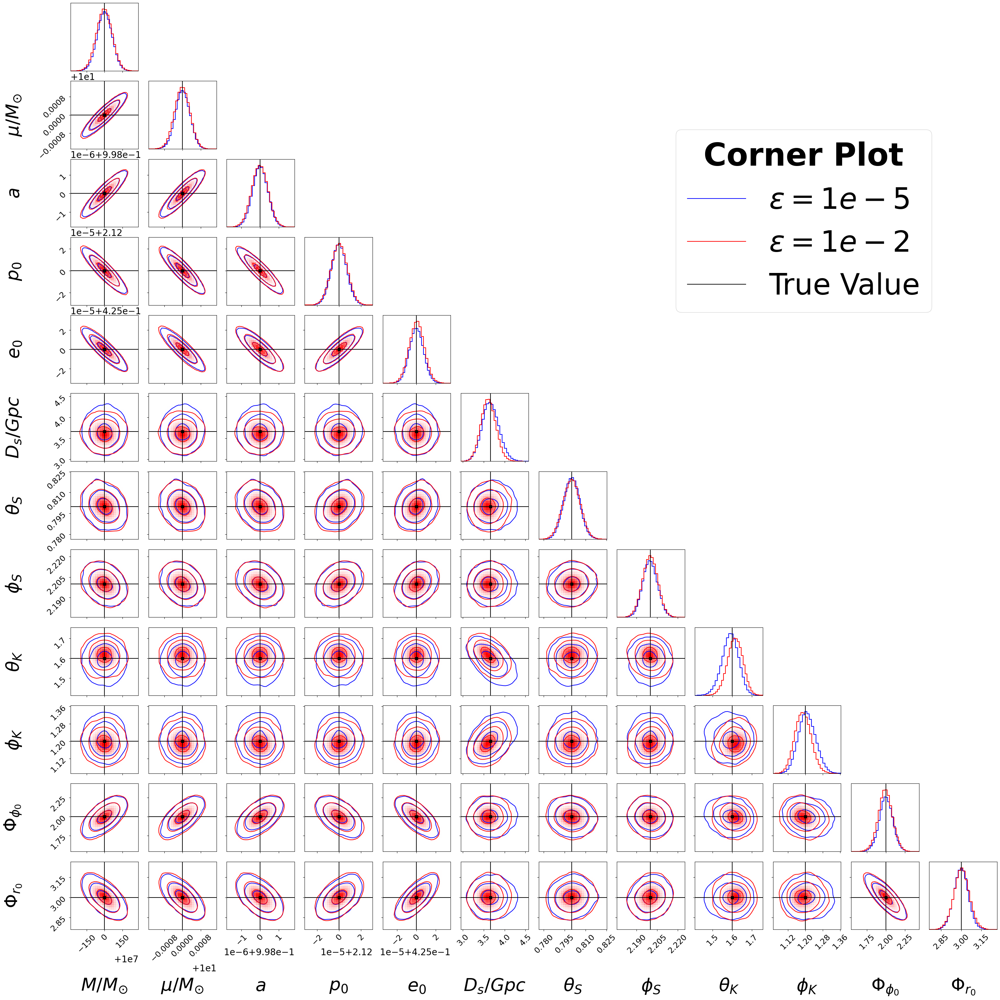

In [ ]:

true_vals_EMRI_case_2 = [1e7, 10.0, 0.998, 2.12, 0.425, median_dist_retro_EMRI, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(burned_samples_extreme_EMRI_1eneg5)
samples_corner_1eneg2 = np.column_stack(burned_samples_extreme_EMRI_1eneg2)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg2[:,0]))*np.ones(len(samples_corner_1eneg2[:,0]))
corner.corner(samples_corner_1eneg2, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_EMRI_case_2[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_EMRI_case_2[yi], color="k")
        ax.axvline(true_vals_EMRI_case_2[xi],color= "k")
        ax.plot(true_vals_EMRI_case_2[xi], true_vals_EMRI_case_2[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)
blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-2$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



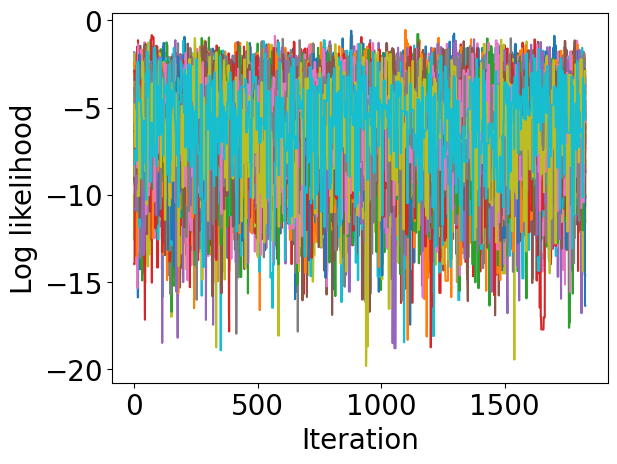

1827


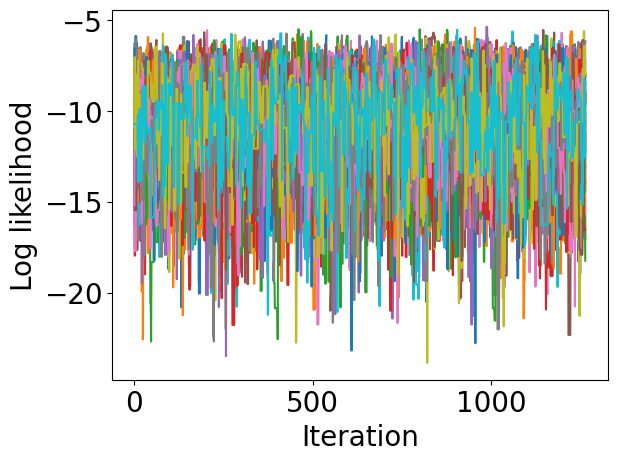

In [28]:
file_path_light_IMRI_1eneg5 = run_direc + "/Case_4_light_IMRI_prograde/" + 'MCMC_samps_M_1e5_mu_1e3_a_0p998_p0_74p94184_e0_0p85_pro_SNR_200_eps_0p0_recov_eps_1e-5_dt_2_T_2_TDI2_w_background_equal_arms.h5'
file_path_light_IMRI_1eneg3 = run_direc + "/Case_4_light_IMRI_prograde/" + 'MCMC_samps_M_1e5_mu_1e3_a_0p998_p0_74p94184_e0_0p85_pro_SNR_200_eps_0p0_recov_eps_1e-3_dt_2_T_2_TDI2_w_background_equal_arms.h5'

burned_samples_light_IMRI_1eneg5, _, log_like_IMRI, N_params = analyse_samples(file_path_light_IMRI_1eneg5, discard = 200)
print(len(log_like_IMRI[:,0,:]))
plt.clf()
burned_samples_light_IMRI_1eneg3, _, log_like_IMRI, N_params = analyse_samples(file_path_light_IMRI_1eneg3, discard = 400)
# print(len(log_like_IMRI[:,0,:]))
median_dist_light_IMRI = np.median(burned_samples_light_IMRI_1eneg5[0][:,5])

true_vals_EMRI_case_4 = [1e5, 1e3, 0.95, 74.38304, 0.85, median_dist_light_IMRI, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]

save_samples_h5(burned_samples_light_IMRI_1eneg5, no_samples = 30000, 
                    true_vals = true_vals_EMRI_case_4, 
                    file_name = "/Light_IMRI_case_5_1eneg5.h5", param_labels = "param_labels",
                    file_path = run_direc + "Case_4_light_IMRI_prograde")

save_samples_h5(burned_samples_light_IMRI_1eneg3, no_samples = 30000, 
                    true_vals = true_vals_EMRI_case_4, 
                    file_name = "/Light_IMRI_case_5_1eneg3.h5", param_labels = "param_labels",
                    file_path = run_direc + "Case_4_light_IMRI_prograde")

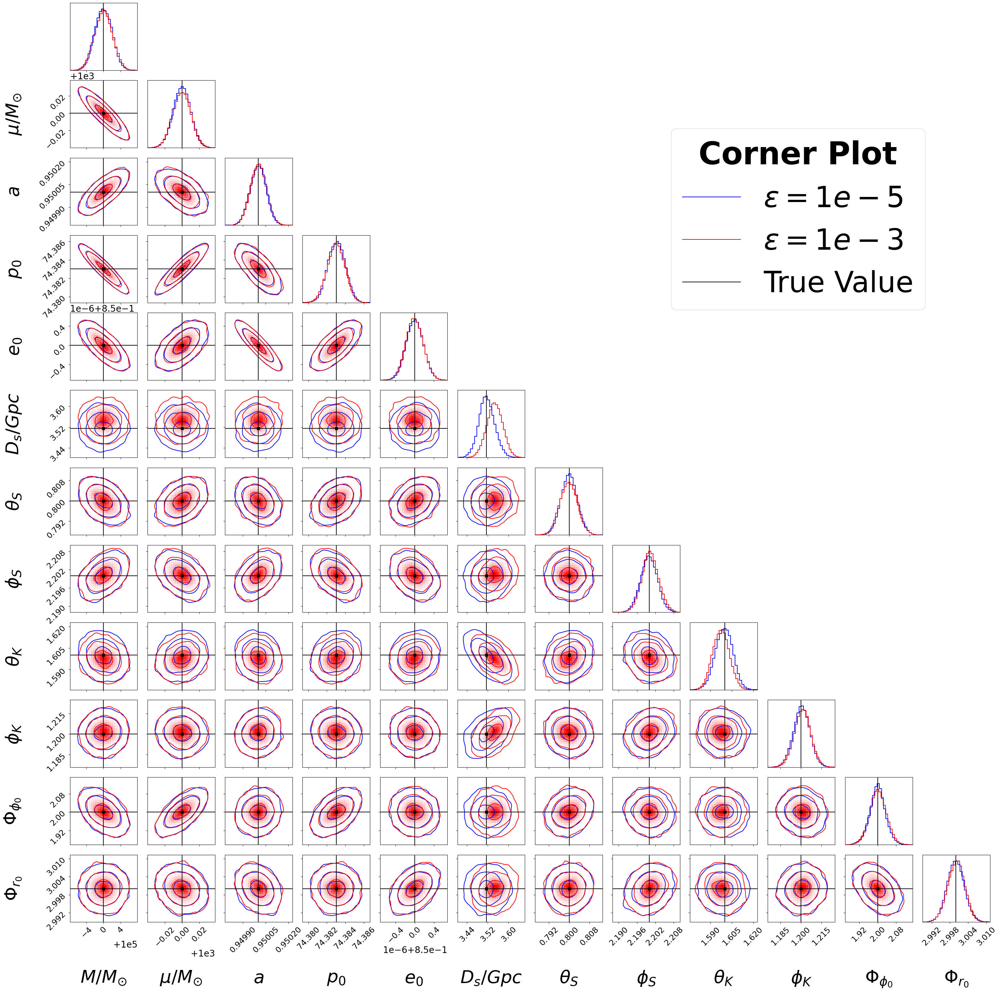

In [14]:
# CASE 4
# Light IMRI

# M = 1e5; mu = 1e3; a = 0.95; p0 = 74.38304; e0 = 0.85; x_I0 = 1.0
# SNR_choice = 200; 
# qS = 0.8 ; phiS = 2.2; qK = 1.6; phiK = 1.2; 
# Phi_phi0 = 2.0; Phi_theta0 = 0.0; Phi_r0 = 3.0

# delta_t = 2.0; T = 2.0;

true_vals_EMRI_case_4 = [1e5, 1e3, 0.95, 74.38304, 0.85, median_dist_light_IMRI, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(burned_samples_light_IMRI_1eneg5)
samples_corner_1eneg3 = np.column_stack(burned_samples_light_IMRI_1eneg3)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg3[:,0]))*np.ones(len(samples_corner_1eneg3[:,0]))
corner.corner(samples_corner_1eneg3, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_EMRI_case_4[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_EMRI_case_4[yi], color="k")
        ax.axvline(true_vals_EMRI_case_4[xi],color= "k")
        ax.plot(true_vals_EMRI_case_4[xi], true_vals_EMRI_case_4[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)
blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-3$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
# plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



# Corner plots and uncertainty table

`pysco` is a package that can be installed from  https://github.com/asantini29/pysco

Plus, to reproduce the exact corner plot of the paper, you need to install my branch of chainconsumer from https://github.com/asantini29/ChainConsumer

In [6]:
import pysco
import pandas as pd
import astropy.units as u
from astropy.cosmology import Planck18, z_at_value
from tqdm.notebook import tqdm
# use autoreload
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
os.environ["CUDA_VISIBLE_DEVICES"] = "6"
import few
from few.trajectory.inspiral import EMRIInspiral

cfg_set = few.get_config_setter(reset=True)
cfg_set.enable_backends("cuda12x", "cpu")

traj_model = EMRIInspiral(func="KerrEccEqFlux")

/data/asantini/miniconda3/envs/few_paper/lib/python3.12/site-packages/multispline/spline.py:71: SyntaxWarning: invalid escape sequence '\l'
  """
/data/asantini/miniconda3/envs/few_paper/lib/python3.12/site-packages/multispline/spline.py:398: SyntaxWarning: invalid escape sequence '\l'
  """
/data/asantini/miniconda3/envs/few_paper/lib/python3.12/site-packages/multispline/spline.py:736: SyntaxWarning: invalid escape sequence '\l'
  """


KeyboardInterrupt: 

In [ ]:
# try to load from csv
import pandas as pd
try:
    ef_pd = pd.read_csv('final_eccentricities.csv')
    ef_dict = ef_pd.to_dict(orient='list')
except FileNotFoundError:
    # if not found, create an empty dictionary
    ef_dict = {}

In [6]:
import healpy as hp

def sky_area_credible_region(theta_samples, phi_samples, credible_level=0.99, nside=256):
    """
    Estimate the credible region area (in square degrees) from sky posterior samples.

    Parameters:
    - theta_samples: array-like, polar angles in radians
    - phi_samples: array-like, azimuthal angles in radians
    - credible_level: float, e.g., 0.99 for 99%
    - nside: HEALPix resolution (higher = finer)

    Returns:
    - area_deg2: credible region area in square degrees
    """
    npix = hp.nside2npix(nside)
    pix_indices = hp.ang2pix(nside, theta_samples, phi_samples)
    
    # Histogram the samples into HEALPix pixels
    hist = np.bincount(pix_indices, minlength=npix)
    prob_density = hist / np.sum(hist)

    # Sort pixels by descending probability
    sorted_probs = np.sort(prob_density)[::-1]
    cumulative = np.cumsum(sorted_probs)

    # Find the number of pixels to reach the desired credible level
    cutoff_idx = np.searchsorted(cumulative, credible_level)
    threshold = sorted_probs[cutoff_idx]

    # Mask for all pixels above this threshold
    credible_pixels = prob_density >= threshold
    pixel_area_sr = hp.nside2pixarea(nside)  # In steradians
    area_sr = np.sum(credible_pixels) * pixel_area_sr

    # Convert to square degrees
    area_deg2 = area_sr * (180/np.pi)**2
    return area_deg2

In [7]:
cosmo = Planck18 #FlatLambdaCDM(H0=70, Om0=0.3, Tcmb0=2.725)

def get_redshift(distance):
    return (z_at_value(cosmo.luminosity_distance, distance * u.Gpc )).value

def get_distance(redshift):
    return cosmo.luminosity_distance(redshift).to(u.Gpc).value

def get_final_eccentricity(m1_arr, m2_arr, a_arr, p0_arr, e0_arr, xI0_arr, T=2.0):
    """
    Calculate the final eccentricity of an EMRI system after inspiral.

    Parameters:
    - m1_arr (ndarray): mass of the primary black hole 
    - m2_arr (ndarray): mass of the secondary black hole
    - a_arr (ndarray): semi-major axis
    - p0_arr (ndarray): initial periastron distance
    - e0_arr (ndarray): initial eccentricity
    - xI0_arr (ndarray): initial inclination

    Returns:
    - e_final: final eccentricity
    """
    # Calculate the final eccentricity using the given parameters
    ef = np.empty_like(m1_arr)
    for i, (m1, m2, a, p0, e0, xI0) in tqdm(enumerate(zip(m1_arr, m2_arr, a_arr, p0_arr, e0_arr, xI0_arr)), total=len(m1_arr)):

        t, p, e, xI, Phi_phi, Phi_theta, Phi_r = traj_model(m1, m2, a, p0, e0, xI0, T=T)

        # Get the final eccentricity
        ef[i] = e[-1]
    
    return ef


def sky_error_area(cov_theta_phi, theta0_rad):
    """
    Compute 1-sigma sky error ellipse area from a covariance matrix in spherical coordinates.

    Parameters:
    - cov_theta_phi: 2x2 numpy array, covariance matrix in (theta, phi), angles in radians
    - theta0_rad: float, central polar angle theta (in radians)

    Returns:
    - area_sr: area in steradians
    - area_deg2: area in square degrees
    """
    # Jacobian to convert angular uncertainty to arc lengths on sphere
    sin_theta = np.sin(theta0_rad)
    J = np.array([[1, 0], [0, sin_theta]])
    
    # Transformed covariance matrix in arc lengths
    cov_arc = J @ cov_theta_phi @ J.T
    
    # Area of the 1-sigma error ellipse (in steradians)
    det_cov = np.linalg.det(cov_arc)
    area_sr = np.pi * np.sqrt(det_cov)
    
    # Convert to square degrees
    area_deg2 = area_sr * (180 / np.pi)**2
    
    return area_sr, area_deg2

def prepare_latex_table(samples_df, param_labels, xI, key):
    """
    Prepare a LaTeX table from the samples dictionary and parameter labels.
    
    Parameters
    ----------
    samples_dict : dict
        Dictionary containing the samples for each parameter.
    param_labels : list
        List of parameter labels.
    
    Returns
    -------
    str
        LaTeX table as a string.
    """    
    m1_det = samples_df[param_labels[0]].values
    m2_det = samples_df[param_labels[1]].values

    a = samples_df[param_labels[2]].values
    p0 = samples_df[param_labels[3]].values
    e0 = samples_df[param_labels[4]].values
    
    dl = samples_df[param_labels[5]].values
    z = get_redshift(dl)
    
    m1_source = m1_det / (1 + z)
    m2_source = m2_det / (1 + z)

    m1_source_median = np.median(m1_source)
    m2_source_median = np.median(m2_source)

    m1_source_std = np.std(m1_source)
    m2_source_std = np.std(m2_source)

    m1_det_median = np.median(m1_det)
    m2_det_median = np.median(m2_det)
    m1_det_std = np.std(m1_det)
    m2_det_std = np.std(m2_det)

    print("In the detector frame:")
    print("delta_m1 = ", str(m1_det_std / m1_det_median))
    print("delta_m2 = ", str(m2_det_std / m2_det_median))

    a_median = np.median(a)
    a_std = np.std(a)

    if key in list(ef_dict.keys()):
        ef = ef_dict[key]
    else:
        ef = get_final_eccentricity(m1_det, m2_det, a, p0, e0, np.full_like(m1_det, xI))
        ef_dict[key] = ef

    ef_median = np.median(ef)
    ef_std = np.std(ef)

    dl_median = np.median(dl)
    dl_std = np.std(dl)

    col_1 = m1_source_std / m1_source_median
    col_2 = m2_source_std / m2_source_median
    col_3 = a_std / a_median
    
    #fill final eccentricity column
    col_4 = ef_std / ef_median

    col_5 = dl_std / dl_median

    # print("m1_source = ", str(m1_source_std / m1_source_median))
    # print("m2_source = ", str(m2_source_std / m2_source_median))


    thetaS = samples_df[param_labels[6]].values
    phiS = samples_df[param_labels[7]].values

    area_deg2 = sky_area_credible_region(thetaS, phiS, credible_level=0.99, nside=256)
    
    # sky_cov_matrix = np.zeros((2,2))
    # sky_cov_matrix[0,0] = np.var(thetaS)
    # sky_cov_matrix[1,1] = np.var(phiS)
    # sky_cov_matrix[0,1] = np.cov(thetaS, phiS)[0,1]
    # sky_cov_matrix[1,0] = np.cov(thetaS, phiS)[1,0]

    # thetaS_median = np.median(thetaS)

    # area_sr, area_deg2 = sky_error_area(sky_cov_matrix, thetaS_median)
    #print("area_sr = ", area_sr)
    #print("area_deg2 = ", area_deg2)

    #print a string with the row of the latex table
    latex_string = f"{col_1:.4e} & {col_2:.4e} & {col_3:.4e} & {col_4:.4e} & {col_5:.4e} & {area_deg2:.4e} \\\\"

    return latex_string

In [ ]:
def sky_area_paper(df, param_labels, nsigma=1):
    """
    Definition of sky area used in the paper. 
    """
    thetaS = df[param_labels[6]].values
    phiS = df[param_labels[7]].values


    #area_deg2 = sky_area_credible_region(thetaS, phiS, credible_level=0.99, nside=256)

    Sigma = np.cov(thetaS, phiS)

    thetaS_median = np.median(thetaS)

    area_deg2 = 2 * np.pi * np.sin(thetaS_median) * np.sqrt(np.linalg.det(Sigma)) * (180.0 / np.pi) ** 2 * nsigma ** 2
    
    print("area_deg2 = ", area_deg2)

In [120]:
pysco.plot.default_plotting(style='light')
plot_dir = 'corner_plots/'
spacing = 5.0
padding = (4, 2.5)
plt.rcParams['axes.labelpad'] = 18.0
plt.rcParams['font.size'] = 30
plt.rcParams['xtick.labelsize'] = 25
plt.rcParams['ytick.labelsize'] = 25

chain_kwargs = {"sigmas":[0, 1, 2], "summary_area":0.95}

legend_kwargs = {"fontsize": 50, "bbox_to_anchor":(-5., -5), "title": "Mode selection threshold", "frameon":False}
intrinsic_legend_kwargs = {"fontsize": 30, "bbox_to_anchor":(-2., -0), "title": "Mode selection threshold", "frameon":False}

plotconfig_kwargs = {"show_legend": True, "summarise": False, "spacing": spacing, "max_ticks":4}

## case 1

In [121]:
file_path_1eneg5 = run_direc +  '/Case_1_EMRI_prograde/' + 'prograde_EMRI_case_1_1eneg5.h5'
file_path_1eneg2 = run_direc + '/Case_1_EMRI_prograde/' + 'prograde_EMRI_case_1_1eneg2.h5'

samples_dict_1eneg5, param_labels, true_vals =  load_samples_h5(file_path_1eneg5)
samples_dict_1eneg2, _, _ =  load_samples_h5(file_path_1eneg2)

df_1eneg5 = pd.DataFrame(samples_dict_1eneg5)
df_1eneg2 = pd.DataFrame(samples_dict_1eneg2)

true_vals = dict(zip(param_labels, true_vals))
intrinsic_param_labels = param_labels[:5]

In [122]:
# subtract the true values from the samples
true_vals_plot = true_vals.copy()
for param in param_labels[:5]:

    new_label = r'$\Delta \,' + param[1:]
    param_labels[param_labels.index(param)] = new_label
    intrinsic_param_labels[intrinsic_param_labels.index(param)] = new_label

    df_1eneg5[new_label] = df_1eneg5[param] - true_vals[param]
    df_1eneg2[new_label] = df_1eneg2[param] - true_vals[param]

    true_vals_plot[new_label] = 0.0

In [37]:
print(true_vals)

{'$m_1/M_{\\odot}$': 1000000.0, '$m_2/M_{\\odot}$': 10.0, '$a$': 0.998, '$p_{0}$': 7.7275, '$e_{0}$': 0.73, '$d_{l}/\\rm{Gpc}$': 2.204, '$\\theta_{S}$': 0.8, '$\\phi_{S}$': 2.2, '$\\theta_{K}$': 1.6, '$\\phi_{K}$': 1.2, '$\\Phi_{\\phi_{0}}$': 2.0, '$\\Phi_{r_{0}}$': 3.0}


In [12]:
print(prepare_latex_table(df_1eneg5, param_labels, xI=1.0, key='case1'))

In the detector frame:
delta_m1 =  8.322691372615749e-07
delta_m2 =  1.1399234758369395e-06
9.1810e-03 & 9.1810e-03 & 2.3316e-07 & 7.8538e-05 & 3.8016e-02 & 6.8193e-01 \\


In [ ]:
sky_area_paper(df_1eneg5, param_labels, nsigma=3)

area_deg2 =  1.006273233956808


In [30]:
sky_area_credible_region(df_1eneg5[param_labels[6]].values, df_1eneg5[param_labels[7]].values, credible_level=0.99, nside=128)

1.0491170565139585

In [124]:
dfs = [df_1eneg5, df_1eneg2]
names = [r"$\kappa = 10^{-5}$", r"$\kappa = 10^{-2}$"]
savename = 'case1_emri_prograde'

C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=param_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs,
 legend_kwargs=legend_kwargs,
 savename=savename,
 )

In [123]:
C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=intrinsic_param_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs, 
 legend_kwargs=intrinsic_legend_kwargs,
 savename=savename+'_intrinsic',
 )

## case 2

In [125]:
file_path_1eneg5 = run_direc +  '/Case_2_extreme_EMRI_prograde/' + 'Extreme_EMRI_case_2_1eneg5.h5'
file_path_1eneg2 = run_direc + '/Case_2_extreme_EMRI_prograde/' + 'Extreme_EMRI_case_2_1eneg2.h5'

samples_dict_1eneg5, param_labels, true_vals =  load_samples_h5(file_path_1eneg5)
samples_dict_1eneg2, _, _ =  load_samples_h5(file_path_1eneg2)

df_1eneg5 = pd.DataFrame(samples_dict_1eneg5)
df_1eneg2 = pd.DataFrame(samples_dict_1eneg2)

true_vals = dict(zip(param_labels, true_vals))
intrinsic_param_labels = param_labels[:5]

In [126]:
# subtract the true values from the samples
true_vals_plot = true_vals.copy()
for param in param_labels[:5]:

    new_label = r'$\Delta \,' + param[1:]
    param_labels[param_labels.index(param)] = new_label
    intrinsic_param_labels[intrinsic_param_labels.index(param)] = new_label

    df_1eneg5[new_label] = df_1eneg5[param] - true_vals[param]
    df_1eneg2[new_label] = df_1eneg2[param] - true_vals[param]

    true_vals_plot[new_label] = 0.0

In [127]:
print(true_vals)

{'$m_1/M_{\\odot}$': 10000000.0, '$m_2/M_{\\odot}$': 10.0, '$a$': 0.998, '$p_{0}$': 2.12, '$e_{0}$': 0.425, '$d_{\\rm L}/\\rm{Gpc}$': 3.6603523818019865, '$\\theta_{S}$': 0.8, '$\\phi_{S}$': 2.2, '$\\theta_{K}$': 1.6, '$\\phi_{K}$': 1.2, '$\\Phi_{\\phi_{0}}$': 2.0, '$\\Phi_{r_{0}}$': 3.0}


In [17]:
print(prepare_latex_table(df_1eneg5, param_labels, xI=1.0, key='case2'))

1.6506e-02 & 1.6505e-02 & 3.9600e-07 & 2.9532e-05 & 5.3258e-02 & 2.0982e+00 \\


In [ ]:
sky_area_paper(df_1eneg5, param_labels, nsigma=3)

area_deg2 =  3.8929656303902975


In [128]:
dfs = [df_1eneg5, df_1eneg2]
names = [r"$\kappa = 10^{-5}$", r"$\kappa = 10^{-2}$"]

savename = 'case2_extreme_emri'

C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=param_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, savename=savename, offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs, 
 legend_kwargs=legend_kwargs
 )

In [129]:
C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=intrinsic_param_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, savename=savename+'_intrinsic', offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs, 
 legend_kwargs=intrinsic_legend_kwargs
 )

## case 3

In [130]:
file_path_1eneg5 = run_direc +  '/Case_3_heavy_IMRI_prograde/' + 'Heavy_IMRI_case_5_1eneg5.h5'
file_path_1eneg3 = run_direc + '/Case_3_heavy_IMRI_prograde/' + 'Heavy_IMRI_case_5_1eneg3.h5'
#file_path_1eneg2 = run_direc + '/Case_3_heavy_IMRI_prograde/' + 'Heavy_IMRI_case_5_1eneg2.h5'

samples_dict_1eneg5, param_labels, true_vals =  load_samples_h5(file_path_1eneg5)
samples_dict_1eneg3, _, _ =  load_samples_h5(file_path_1eneg3)
#samples_dict_1eneg2, _, _ =  load_samples_h5(file_path_1eneg2)

df_1eneg5 = pd.DataFrame(samples_dict_1eneg5)
df_1eneg3 = pd.DataFrame(samples_dict_1eneg3)
#df_1eneg2 = pd.DataFrame(samples_dict_1eneg2)

true_vals = dict(zip(param_labels, true_vals))
intrinsic_param_labels = param_labels[:5]

In [131]:
# subtract the true values from the samples
true_vals_plot = true_vals.copy()
for param in param_labels[:5]:

    new_label = r'$\Delta \,' + param[1:]
    param_labels[param_labels.index(param)] = new_label
    intrinsic_param_labels[intrinsic_param_labels.index(param)] = new_label

    df_1eneg5[new_label] = df_1eneg5[param] - true_vals[param]
    df_1eneg3[new_label] = df_1eneg3[param] - true_vals[param]

    true_vals_plot[new_label] = 0.0

In [41]:
print(true_vals)

{'$m_1/M_{\\odot}$': 10000000.0, '$m_2/M_{\\odot}$': 100000.0, '$a$': 0.95, '$p_{0}$': 23.425, '$e_{0}$': 0.85, '$d_{l}/\\rm{Gpc}$': 3.7981743632373774, '$\\theta_{S}$': 0.8, '$\\phi_{S}$': 2.2, '$\\theta_{K}$': 1.6, '$\\phi_{K}$': 1.2, '$\\Phi_{\\phi_{0}}$': 2.0, '$\\Phi_{r_{0}}$': 3.0}


In [19]:
print(prepare_latex_table(df_1eneg5, param_labels, xI=1.0, key='case3'))

2.4590e-03 & 2.4551e-03 & 2.5995e-05 & 2.5450e-04 & 7.7579e-03 & 7.9733e+00 \\


In [ ]:
sky_area_paper(df_1eneg5, param_labels, nsigma=3)

area_deg2 =  17.00602454911769


In [132]:
dfs = [df_1eneg5, df_1eneg3]#, df_1eneg2]
names = [r"$\kappa = 10^{-5}$", r"$\kappa = 10^{-3}$"]#, r"$\kappa = 10^{-2}$"]

savename = 'case3_heavy_imri'

C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=param_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, savename=savename, offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs, 
 legend_kwargs=legend_kwargs
 )

In [133]:
C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=intrinsic_param_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, savename=savename+'_intrinsic', offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs, 
 legend_kwargs=intrinsic_legend_kwargs
 )

## case 4

In [134]:
file_path_1eneg5 = run_direc +  '/Case_4_light_IMRI_prograde/' + 'Light_IMRI_case_5_1eneg5.h5'
file_path_1eneg3 = run_direc + '/Case_4_light_IMRI_prograde/' + 'Light_IMRI_case_5_1eneg3.h5'
#file_path_1eneg2 = run_direc + '/Case_3_heavy_IMRI_prograde/' + 'Heavy_IMRI_case_5_1eneg2.h5'

samples_dict_1eneg5, param_labels, true_vals =  load_samples_h5(file_path_1eneg5)
samples_dict_1eneg3, _, _ =  load_samples_h5(file_path_1eneg3)
#samples_dict_1eneg2, _, _ =  load_samples_h5(file_path_1eneg2)

df_1eneg5 = pd.DataFrame(samples_dict_1eneg5)
df_1eneg3 = pd.DataFrame(samples_dict_1eneg3)
#df_1eneg2 = pd.DataFrame(samples_dict_1eneg2)

true_vals = dict(zip(param_labels, true_vals))
intrinsic_param_labels = param_labels[:5]

In [135]:
# subtract the true values from the samples
true_vals_plot = true_vals.copy()
for param in param_labels[:5]:

    new_label = r'$\Delta \,' + param[1:]
    param_labels[param_labels.index(param)] = new_label
    intrinsic_param_labels[intrinsic_param_labels.index(param)] = new_label

    df_1eneg5[new_label] = df_1eneg5[param] - true_vals[param]
    df_1eneg3[new_label] = df_1eneg3[param] - true_vals[param]

    true_vals_plot[new_label] = 0.0

In [43]:
print(true_vals)

{'$m_1/M_{\\odot}$': 100000.0, '$m_2/M_{\\odot}$': 1000.0, '$a$': 0.95, '$p_{0}$': 74.38304, '$e_{0}$': 0.85, '$d_{l}/\\rm{Gpc}$': 3.514969975967909, '$\\theta_{S}$': 0.8, '$\\phi_{S}$': 2.2, '$\\theta_{K}$': 1.6, '$\\phi_{K}$': 1.2, '$\\Phi_{\\phi_{0}}$': 2.0, '$\\Phi_{r_{0}}$': 3.0}


In [21]:
print(prepare_latex_table(df_1eneg5, param_labels, xI=1.0, key='case4'))

2.6495e-03 & 2.6500e-03 & 5.2389e-05 & 6.9845e-03 & 8.6996e-03 & 6.8193e-01 \\


In [ ]:
sky_area_paper(df_1eneg5, param_labels, nsigma=3)

area_deg2 =  1.0788251819315673


In [136]:
dfs = [df_1eneg5, df_1eneg3]#, df_1eneg2]
names = [r"$\kappa = 10^{-5}$", r"$\kappa = 10^{-3}$"]#, r"$\kappa = 10^{-2}$"]

savename = 'case4_light_imri'

C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=param_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, savename=savename, offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs, 
 legend_kwargs=legend_kwargs
 )

In [137]:
C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=intrinsic_param_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, savename=savename+'_intrinsic', offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs, 
 legend_kwargs=intrinsic_legend_kwargs
 )

In [138]:
intrinsic_param_dl_labels = param_labels[:6]
C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=intrinsic_param_dl_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, savename=savename+'_intrinsic_dl', offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs, 
 legend_kwargs=intrinsic_legend_kwargs
 )

## case 5

In [139]:
file_path_1eneg5 = run_direc +  '/Case_5_EMRI_retrograde/' + 'retrograde_EMRI_case_5_1eneg5.h5'
file_path_1eneg2 = run_direc + '/Case_5_EMRI_retrograde/' + 'retrograde_EMRI_case_5_1eneg2.h5'
#file_path_1eneg2 = run_direc + '/Case_3_heavy_IMRI_prograde/' + 'Heavy_IMRI_case_5_1eneg2.h5'

samples_dict_1eneg5, param_labels, true_vals =  load_samples_h5(file_path_1eneg5)
samples_dict_1eneg2, _, _ =  load_samples_h5(file_path_1eneg2)
#samples_dict_1eneg2, _, _ =  load_samples_h5(file_path_1eneg2)

df_1eneg5 = pd.DataFrame(samples_dict_1eneg5)
df_1eneg2 = pd.DataFrame(samples_dict_1eneg2)
#df_1eneg2 = pd.DataFrame(samples_dict_1eneg2)

true_vals = dict(zip(param_labels, true_vals))
intrinsic_param_labels = param_labels[:5]

In [140]:
# flip the spin sign
true_vals[param_labels[2]] *= -1
df_1eneg5[param_labels[2]] *= -1
df_1eneg2[param_labels[2]] *= -1

In [141]:
# subtract the true values from the samples
true_vals_plot = true_vals.copy()
for param in param_labels[:5]:

    new_label = r'$\Delta \,' + param[1:]
    param_labels[param_labels.index(param)] = new_label
    intrinsic_param_labels[intrinsic_param_labels.index(param)] = new_label

    df_1eneg5[new_label] = df_1eneg5[param] - true_vals[param]
    df_1eneg2[new_label] = df_1eneg2[param] - true_vals[param]

    true_vals_plot[new_label] = 0.0

In [13]:
print(true_vals)

{'$m_1/M_{\\odot}$': 100000.0, '$m_2/M_{\\odot}$': 10.0, '$a$': -0.5, '$p_{0}$': 26.19, '$e_{0}$': 0.8, '$d_{l}/\\rm{Gpc}$': 1.1010604355381368, '$\\theta_{S}$': 0.8, '$\\phi_{S}$': 2.2, '$\\theta_{K}$': 1.6, '$\\phi_{K}$': 1.2, '$\\Phi_{\\phi_{0}}$': 2.0, '$\\Phi_{r_{0}}$': 3.0}


In [23]:
print(prepare_latex_table(df_1eneg5, param_labels, xI=-1.0, key='case5'))

9.1965e-03 & 9.1966e-03 & 1.1830e-04 & 1.5406e-05 & 5.8468e-02 & 9.4421e-01 \\


In [ ]:
sky_area_paper(df_1eneg5, param_labels, nsigma=3)

area_deg2 =  1.5402782784703162


In [31]:
# now check the final eccentricities are consistent with the ones in the paper
for key in ef_dict.keys():
    ef = ef_dict[key]
    print(f"Final eccentricity for {key} is {np.median(ef)} +/- {np.std(ef)}")
    #print(f"Final eccentricity for {key} is {np.mean(ef)} +/- {np.std(ef)}")

Final eccentricity for case1 is 0.04501452526184936 +/- 3.5353697249166196e-06
Final eccentricity for case2 is 0.2612706302794231 +/- 7.715753615321966e-06
Final eccentricity for case3 is 0.023398520978801518 +/- 5.954891585404283e-06
Final eccentricity for case4 is 0.004114728260265285 +/- 2.8739486572425706e-05
Final eccentricity for case5 is 0.19503133652650975 +/- 3.004603207909842e-06


In [30]:
#saves the final eccentricities to a file
df_ef = pd.DataFrame(ef_dict)
df_ef.to_csv('final_eccentricities.csv', index=False)

In [142]:
dfs = [df_1eneg5, df_1eneg2]#, df_1eneg2]
names = [r"$\kappa = 10^{-5}$", r"$\kappa = 10^{-2}$"]#, r"$\kappa = 10^{-2}$"]

savename = 'case5_emri_retrograde'

C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=param_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, savename=savename+'_flipped', offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs, 
 legend_kwargs=legend_kwargs
 )

In [143]:
intrinsic_param_labels = param_labels[:5]
C, _ = pysco.plot.chainplot(
    dfs, names=names, columns=intrinsic_param_labels, ls='-',
truths=true_vals_plot, plot_dir=plot_dir, savename=savename+'_intrinsic_flipped', offset=False, 
padding=padding, 
plotconfig_kwargs=plotconfig_kwargs,
 chainconfig_kwargs=chain_kwargs, 
 legend_kwargs=intrinsic_legend_kwargs
 )

 ### check case 3 final eccentricity


In [35]:
M = 1e7
mu = 1e5
a = 0.950
p0 = 23.425
e0 = 0.85
xI0 = 1.0
T= 2.0

t, p, e, x, Phi_phi, Phi_theta, Phi_r = traj_model(M, mu, a, p0, e0, xI0, T=T)
print("Final eccentricity = ", e[-1])

Final eccentricity =  0.023397778827262225


In [34]:
true_vals

{'$m_1/M_{\\odot}$': 10000000.0,
 '$m_2/M_{\\odot}$': 100000.0,
 '$a$': 0.95,
 '$p_{0}$': 23.425,
 '$e_{0}$': 0.85,
 '$d_{l}/\\rm{Gpc}$': 3.7981743632373774,
 '$\\theta_{S}$': 0.8,
 '$\\phi_{S}$': 2.2,
 '$\\theta_{K}$': 1.6,
 '$\\phi_{K}$': 1.2,
 '$\\Phi_{\\phi_{0}}$': 2.0,
 '$\\Phi_{r_{0}}$': 3.0}